In [ ]:
import os
import matplotlib.pyplot as plt
import numpy as np
import cv2
from google.colab import drive

drive.mount("/content/drive")

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


# **Step 01**

### **1**

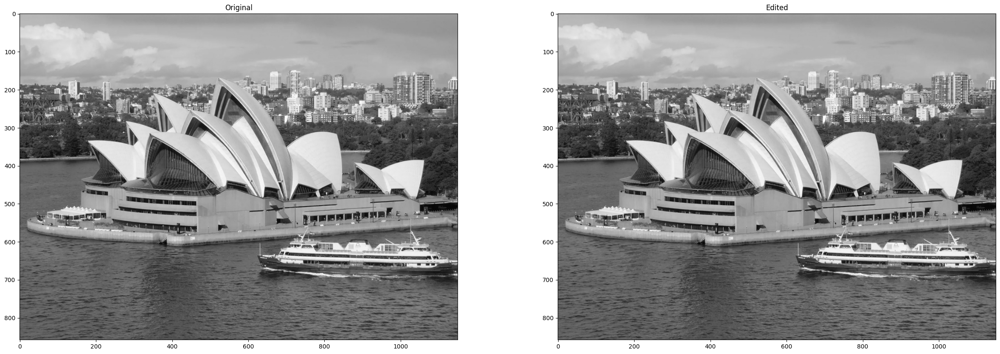

In [ ]:
def apply_convolution(img, kernel):

    result = cv2.filter2D(img, -1, kernel)
    return result

img = cv2.imread("/content/drive/MyDrive/Lab2/image[1].png", cv2.IMREAD_COLOR)

img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

image_1 = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)

identity_kernel = np.array([[0,0,0],
                            [0,1,0],
                            [0,0,0]], dtype = np.uint8)

convolution_image = apply_convolution(image_1, identity_kernel)

plt.figure(figsize = (30,10))
plt.subplot(1,2,1)
plt.title("Original")
plt.imshow(image_1, cmap = "gray")
plt.subplot(1,2,2)
plt.title("Edited")
plt.imshow(convolution_image, cmap = "gray")

In [ ]:
if image_1.all() == convolution_image.all():

    print("After applying the identity kernel, we find no visible changes in the image.")

else:

    print("Changes visible after applying 2D convolution. ")

After applying the identity kernel, we find no visible changes in the image.


In [ ]:
print("After applying the identity kernel, we find no visible changes in the image.")

After applying the identity kernel, we find no visible changes in the image.


### **2**

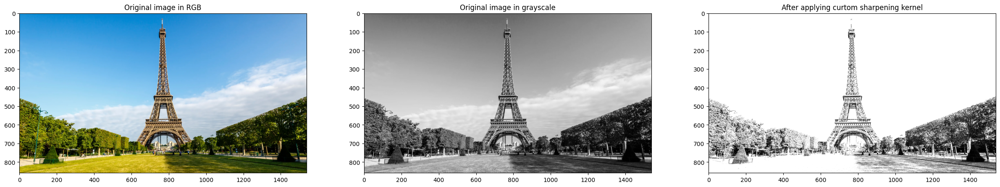

In [ ]:
def apply_sharpening_kernel(img, kernel):

    return cv2.filter2D(img, -1, kernel)

img = cv2.imread("/content/drive/MyDrive/Lab2/image[2].png", cv2.IMREAD_COLOR)

img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

image_2 = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)

custom_sherpening_kernel = np.array([[0,-1,0],
                                     [-1,7,-1],
                                     [0,-1,0]])

result = apply_sharpening_kernel(image_2, custom_sherpening_kernel)

plt.figure(figsize = (30,10))
plt.subplot(1,3,1)
plt.title("Original image in RGB")
plt.imshow(img)

plt.subplot(1,3,2)
plt.title("Original image in grayscale")
plt.imshow(image_2, cmap = "gray")

plt.subplot(1,3,3)
plt.title("After applying curtom sharpening kernel")
plt.imshow(result, cmap = "gray")

In [ ]:
print("After applying the sharpening kernel we find the the new image has its edges enhanced and also there is a increase in the contrast")

After applying the sharpening kernel we find the the new image has its edges enhanced and also there is a increase in the contrast


# **Step 2**

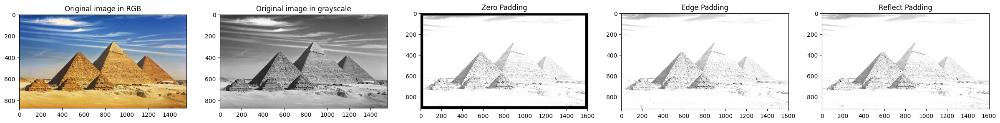

In [ ]:
def zero_padding(img, pad_width):

    return np.pad(img, pad_width=pad_width, mode = "constant", constant_values = 0).astype(np.uint8)

def reflect_padding(img, pad_width):

    return np.pad(img, pad_width=pad_width, mode = "reflect").astype(np.uint8)

def edge_padding(img, pad_width):

    return np.pad(img, pad_width=pad_width, mode = "edge" ).astype(np.uint8)


pad_width = 25


img = cv2.imread("/content/drive/MyDrive/Lab2/image[3].png", cv2.IMREAD_COLOR)

img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

image_3 = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)

zero = zero_padding(image_3, pad_width)
zero = apply_sharpening_kernel(zero, custom_sherpening_kernel)

edge = edge_padding(image_3, pad_width)
edge = apply_sharpening_kernel(edge, custom_sherpening_kernel)

reflect = reflect_padding(image_3, pad_width)
reflect = apply_sharpening_kernel(reflect, custom_sherpening_kernel)


plt.figure(figsize=(30,10))

plt.subplot(1, 5, 1)
plt.title("Original image in RGB")
plt.imshow(img)

plt.subplot(1, 5, 2)
plt.title("Original image in grayscale")
plt.imshow(image_3, cmap = "gray")

plt.subplot(1, 5, 3)
plt.title("Zero Padding")
plt.imshow(zero, cmap = "gray")

plt.subplot(1, 5, 4)
plt.title("Edge Padding")
plt.imshow(edge, cmap = "gray")

plt.subplot(1, 5, 5)
plt.title("Reflect Padding")
plt.imshow(reflect, cmap = "gray")

# **Step 3**

###**4**


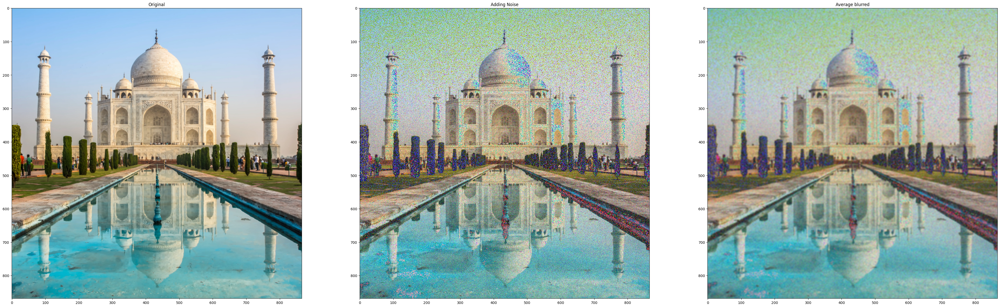

In [ ]:
def adding_noise( img, mean = 0, sigma = 25):
    return img + np.random.normal(mean, sigma, img.shape).astype(np.uint8)

img = cv2.imread("/content/drive/MyDrive/Lab2/image[4].png", cv2.IMREAD_COLOR)

image_4 = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

noisy_image = adding_noise(image_4)

avg_blurred = cv2.blur(noisy_image, (5,5))

# plt.imshow(noisy_image)

plt.figure(figsize=(50,20))
plt.subplot(1, 3, 1)
plt.title("Original")
plt.imshow(image_4)

plt.subplot(1, 3, 2)
plt.title("Adding Noise")
plt.imshow(noisy_image)

plt.subplot(1, 3, 3)
plt.title("Average blurred")
plt.imshow(avg_blurred)

In [ ]:
print("After applying average blur the noisy image gets more smoother and so does the noise")

After applying average blur the noisy image gets more smoother and so does the noise


### **5**

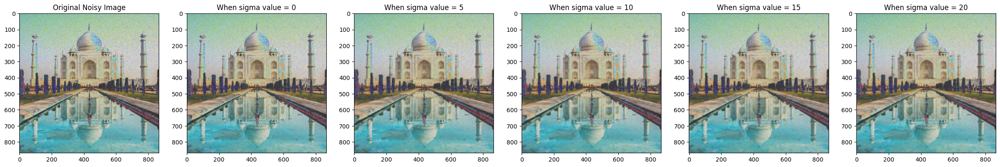

In [ ]:
def add_gaussian_blur(img, sigma_val):
    return cv2.GaussianBlur(img, (5,5), sigmaX = sigma_val)

sigma_vals = list(range(0, 21, 5))

plt.figure(figsize=(30,10))
plt.subplot(1, (len(sigma_vals)) + 1, 1)
plt.title("Original Noisy Image")
plt.imshow(noisy_image)


i = 0
while i<len(sigma_vals) :
    plt.subplot(1, (len(sigma_vals)) + 1, i + 2)
    plt.title(f"When sigma value = {sigma_vals[i]}")
    plt.imshow(add_gaussian_blur(noisy_image, sigma_vals[i]))
    i+=1


In [ ]:
print("A smaller value of the sigma preserves the details and noise in the noisy image. When the value is increased the images gets more and more smooth")

A smaller value of the sigma preserves the details and noise in the noisy image. When the value is increased the images gets more and more smooth


# **Step 4**

### **6**

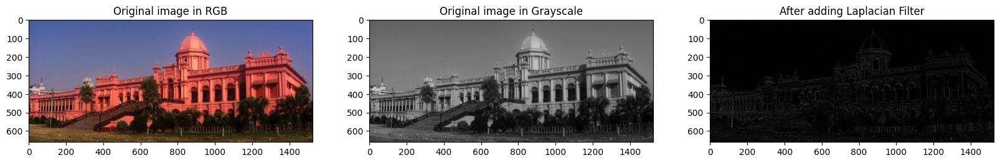

In [ ]:
img = cv2.imread("/content/drive/MyDrive/Lab2/image[5].png", cv2.IMREAD_COLOR)

img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

image_5 = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)

laplaced_image = cv2.Laplacian(image_5, cv2.CV_64F)
laplaced_image = cv2.convertScaleAbs(laplaced_image)

plt.figure(figsize = (20,5))
plt.subplot(1,3,1)
plt.title("Original image in RGB")
plt.imshow(img)
plt.subplot(1,3,2)
plt.title("Original image in Grayscale")
plt.imshow(image_5, cmap = "gray")
plt.subplot(1,3,3)
plt.title("After adding Laplacian Filter")
plt.imshow(laplaced_image, cmap = "gray")

###**7**

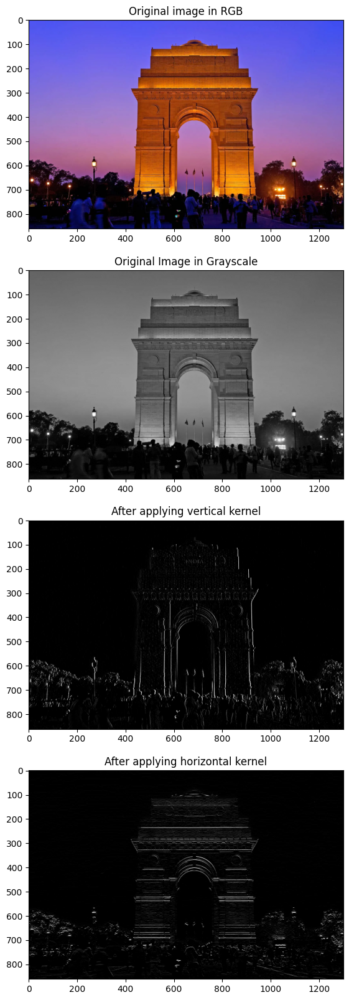

In [ ]:
import os
import matplotlib.pyplot as plt
import numpy as np
import cv2

img = cv2.imread("/content/drive/MyDrive/Lab2/image[6].png", cv2.IMREAD_COLOR)

img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

image_6 = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)


vertical_kernel = np.array([[-1, 0, 1],
                          [-1, 0, 1],
                          [-1, 0, 1]], dtype = int)

horizontal_kernel = np.array([[-1, -1, -1],
                              [0, 0, 0],
                              [1, 1, 1]], dtype = int)


vertical_kernel_applied = apply_convolution(image_6, vertical_kernel)
horizontal_kernel_applied = apply_convolution(image_6, horizontal_kernel)

plt.figure(figsize = (10,20))
plt.subplot(4, 1, 1)
plt.title("Original image in RGB")
plt.imshow(img)
plt.subplot(4, 1, 2)
plt.title("Original Image in Grayscale")
plt.imshow(image_6, cmap = "gray")
plt.subplot(4, 1, 3)
plt.title("After applying vertical kernel")
plt.imshow(vertical_kernel_applied, cmap = "gray")
plt.subplot(4, 1, 4)
plt.title("After applying horizontal kernel")
plt.imshow(horizontal_kernel_applied, cmap = "gray")

In [ ]:
print("The horizontal kernel highlights emphasizes the horizontal structure, meaning where the changes occur from top to bottom\nThe Vertical kernel highlights emphasizes the vertical structure, meaning where the changes occur from left to right")

The horizontal kernel highlights emphasizes the horizontal structure, meaning where the changes occur from top to bottom
The Vertical kernel highlights emphasizes the vertical structure, meaning where the changes occur from left to right


# **Step 05**

## **8**

### **Task 1**

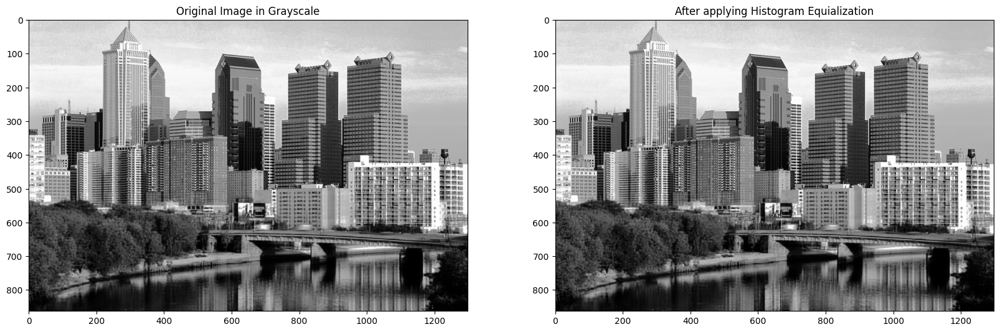

In [ ]:
img = cv2.imread("/content/drive/MyDrive/Lab2/image[6].png", cv2.IMREAD_COLOR)

img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

image_6  = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)


histogram_applied = cv2.equalizeHist(image_7)

plt.figure(figsize = (20,10))
plt.subplot(1, 2, 1)
plt.title("Original Image in Grayscale")
plt.imshow(image_7, cmap = 'gray')
plt.subplot(1, 2, 2)
plt.title("After applying Histogram Equialization")
plt.imshow(histogram_applied,cmap = 'gray')

In [ ]:
print("Applying the Histogram equalization on the source image we get an image that looks more clear and has a better visibility")

Applying the Histogram equalization on the source image we get an image that looks more clear and has a better visibility


###**Task 2**

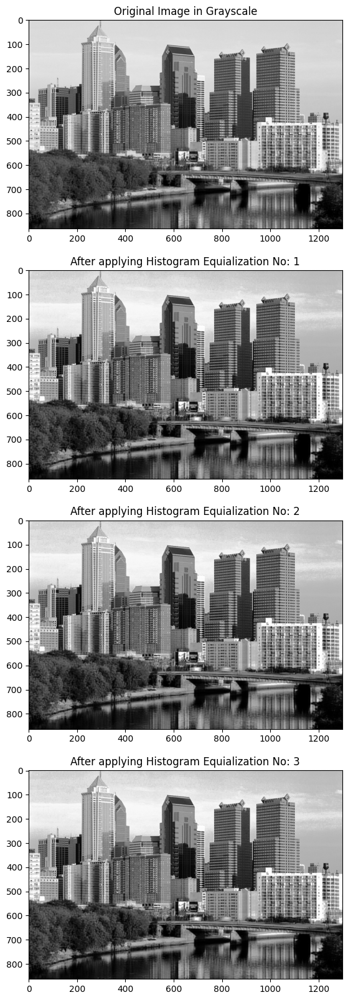

In [ ]:
img = cv2.imread("/content/drive/MyDrive/Lab2/image[7].png", cv2.IMREAD_COLOR)

img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

image_7 = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)


plt.figure(figsize = (10,20))


plt.subplot(4, 1, 1)
plt.title("Original Image in Grayscale")
plt.imshow(image_7, cmap = 'gray')


for i in range(1, 4):
    histogram_applied = cv2.equalizeHist(image_7)
    image_7 = histogram_applied
    plt.subplot(4 , 1, i+1)
    plt.title(f"After applying Histogram Equialization No: {i}")
    plt.imshow(image_7, cmap = 'gray')


In [ ]:
print('Applying histogram equalization 3 times does no show any major visible changes and the later results resemble the resultant image we got applying this function first time')

Applying histogram equalization 3 times does no show any major visible changes and the later results resemble the resultant image we got applying this function first time
